In [1]:
# import tensorflow and other libraries
import tensorflow as tf
import os
import pathlib
import time
import datetime
from matplotlib import pyplot as plt
from IPython import display

2024-08-08 15:13:47.994791: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-08-08 15:13:47.994941: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-08-08 15:13:48.131235: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:
# Define the path using pathlib and load the dataset
from pathlib import Path
PATH =Path(r"../input/pix2pix-dataset/maps/maps")

In [3]:
list(PATH.parent.iterdir())

[PosixPath('../input/pix2pix-dataset/maps/maps')]

In [4]:
#find the size of the image and split it into 2 images
sample_image = tf.io.read_file(str('../input/pix2pix-dataset/maps/maps/train/1.jpg')) 
sample_image = tf.io.decode_jpeg(sample_image)
print(sample_image.shape)

(600, 1200, 3)


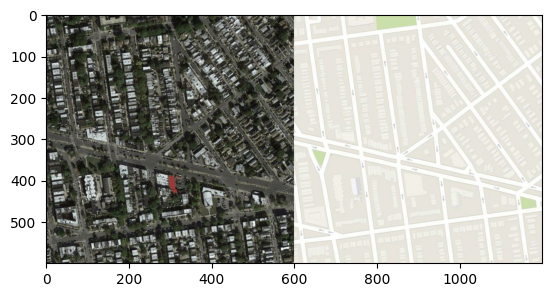

In [5]:
plt.figure()
plt.imshow(sample_image)
plt.show()

In [6]:
def load(image_file):
  # Read and decode an image file to a uint8 tensor
  image = tf.io.read_file(image_file)
  image = tf.io.decode_jpeg(image)
  # Split each image tensor into two tensors:
  # - one with a real building facade image
  # - one with an architecture label image 
  w = tf.shape(image)[1] //2
  input_image = image[:, :w, :]
  real_image = image[:, w:, :]

  # Convert both images to float32 tensors
  input_image = tf.cast(input_image, tf.float32)
  real_image = tf.cast(real_image, tf.float32)

  return input_image, real_image

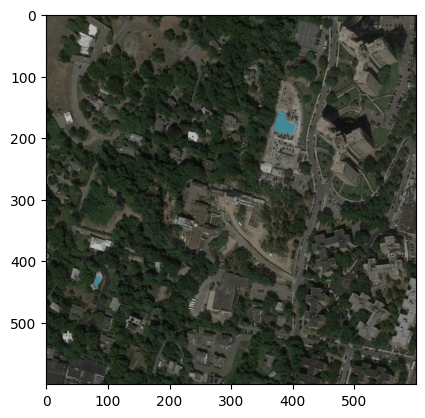

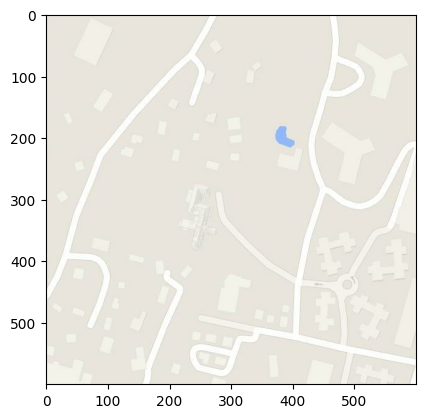

In [7]:
inp, re = load(str('../input/pix2pix-dataset/maps/maps/train/100.jpg'))
# Casting to int for matplotlib to display the images
plt.figure()
plt.imshow(inp / 255.0)
plt.figure()
plt.imshow(re / 255.0)

In [8]:
# The maps training set consist of x images
BUFFER_SIZE = 600
# The batch size of 1 produced better results for the U-Net in the original pix2pix experiment
BATCH_SIZE = 1
# final image size:
IMG_WIDTH = 256
IMG_HEIGHT = 256

In [9]:
def resize(input_image, real_image, height, width):
  input_image = tf.image.resize(input_image, [height, width],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  real_image = tf.image.resize(real_image, [height, width],
                               method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  return input_image, real_image

In [10]:
def random_crop(input_image, real_image):
  stacked_image = tf.stack([input_image, real_image], axis=0)
  cropped_image = tf.image.random_crop(
      stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])

  return cropped_image[0], cropped_image[1]

In [11]:
# Normalizing the images to [-1, 1]
def normalize_image(input_image, real_image):
  input_image = 2*(input_image/ 255.0)-1
  real_image = 2*(real_image/ 255.0) - 1
  return input_image, real_image

In [12]:
@tf.function()
def random_jitter(input_image, real_image):
  # Resizing to 330x330
  input_image, real_image = resize(input_image,real_image,330,330)

  # Random cropping back to 256x256
  input_image, real_image = tf.image.random_crop(value=input_image,size=(256,256,3)),tf.image.random_crop(value=real_image,size=(256,256,3))

  if tf.random.uniform(()) > 0.5:
    # Random mirroring
    input_image = tf.image.flip_left_right(input_image)
    real_image = tf.image.flip_left_right(real_image)

  return input_image, real_image

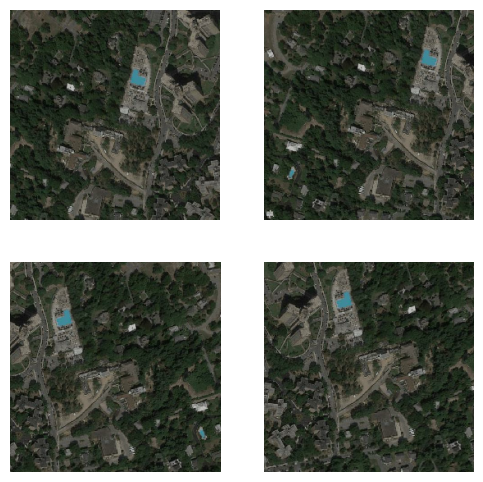

In [13]:
plt.figure(figsize=(6, 6))
for i in range(4):
  rj_inp, rj_re = random_jitter(inp, re)
  plt.subplot(2, 2, i + 1)
  plt.imshow(rj_inp / 255.0)
  plt.axis('off')
plt.show()

In [14]:
print(rj_inp.shape)

(256, 256, 3)


In [15]:
def load_image_train(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = resize(input_image,real_image,IMG_HEIGHT,IMG_WIDTH)
  input_image, real_image = normalize_image(input_image,real_image)
  return input_image, real_image

In [16]:
def load_image_test(image_file):
  input_image, real_image =load(image_file)
  input_image, real_image = resize(input_image,real_image,IMG_HEIGHT,IMG_WIDTH)
  input_image, real_image = normalize_image(input_image,real_image)
  return input_image, real_image

In [17]:
train_dataset = tf.data.Dataset.list_files(str(PATH/'train/*.jpg'))
train_dataset = train_dataset.map(load_image_train,num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

In [18]:
test_dataset = tf.data.Dataset.list_files(str(PATH / 'val/*.jpg'))
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)

In [19]:
OUTPUT_CHANNELS = 3

In [20]:
from keras import layers,models

In [21]:
def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                                      kernel_initializer=initializer, use_bias=not apply_batchnorm))

  if apply_batchnorm:
        result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())
  return result

In [22]:
down_model = downsample(3, 4)
down_result = down_model(tf.expand_dims(inp, 0))
print (down_result.shape)

(1, 300, 300, 3)


In [23]:
def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(tf.keras.layers.Conv2DTranspose(filters, size, strides=2, padding='same',
                                               kernel_initializer=initializer, use_bias=not apply_dropout))

  if apply_dropout:
        result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.ReLU())
  return result

In [24]:
up_model = upsample(3, 4)
up_result = up_model(down_result)
print (up_result.shape)

(1, 600, 600, 3)


In [25]:
def Generator():
  inputs = tf.keras.layers.Input(shape=[256, 256, 3])

  down_stack = [
    downsample(64, 4, apply_batchnorm=False),  # (batch_size, 128, 128, 64)
    downsample(128, 4),  # (batch_size, 64, 64, 128)
    downsample(256, 4),  # (batch_size, 32, 32, 256)
    downsample(512, 4),  # (batch_size, 16, 16, 512)
    downsample(512, 4),  # (batch_size, 8, 8, 512)
    downsample(512, 4),  # (batch_size, 4, 4, 512)
    downsample(512, 4),  # (batch_size, 2, 2, 512)
    downsample(512, 4),  # (batch_size, 1, 1, 512)
  ]

  up_stack = [
    upsample(512, 4, apply_dropout=True),  # (batch_size, 2, 2, 1024) -> (batch_size, 2, 2, 512)
        upsample(512, 4, apply_dropout=True),  # (batch_size, 4, 4, 1024) -> (batch_size, 4, 4, 512)
        upsample(512, 4, apply_dropout=True),  # (batch_size, 8, 8, 1024) -> (batch_size, 8, 8, 512)
        upsample(512, 4, apply_dropout=True),  # (batch_size, 16, 16, 1024) -> (batch_size, 16, 16, 512)
        upsample(256, 4, apply_dropout=True),  # (batch_size, 32, 32, 512) -> (batch_size, 32, 32, 256)
        upsample(128, 4, apply_dropout=True),  # (batch_size, 64, 64, 256) -> (batch_size, 64, 64, 128)
        upsample(64, 4, apply_dropout=True),   # (batch_size, 128, 128, 128) -> (batch_size, 128, 128, 64)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')  # (batch_size, 256, 256, 3)

  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])
  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

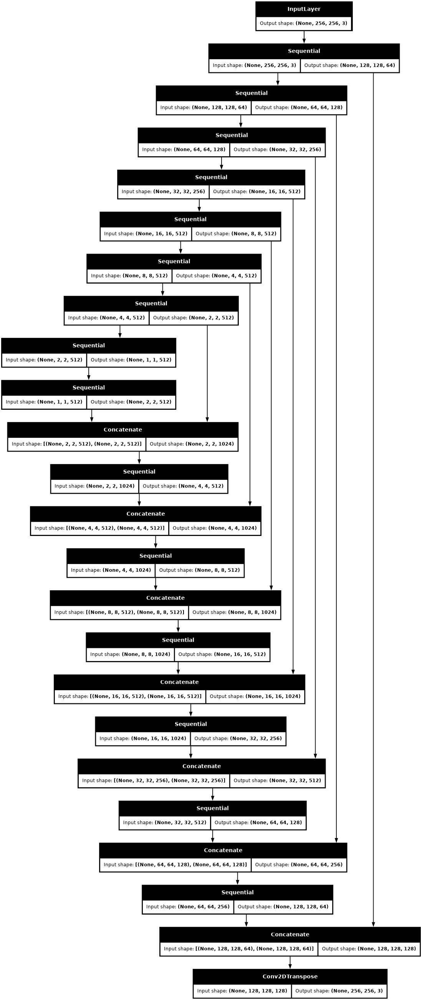

In [26]:
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

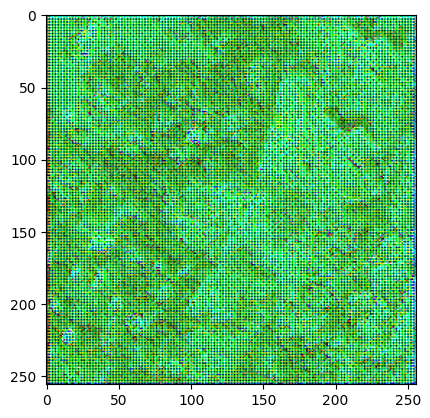

In [27]:
inp = tf.image.resize(inp, [256, 256],
                                 method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
gen_output = generator(inp[tf.newaxis, ...], training=False)
plt.imshow(gen_output[0, ...])

In [28]:
LAMBDA = 100

In [29]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [30]:
def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # Mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss, gan_loss, l1_loss

In [31]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
  tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

  x = tf.keras.layers.concatenate([inp, tar])  # (batch_size, 256, 256, channels*2)
  # Downsampling #
  down1 = downsample(64, 4, apply_batchnorm=False)(x)   # (batch_size, 128, 128, 64)
  down2 = downsample(128, 4)(down1)                     # (batch_size, 64, 64, 128)
  down3 = downsample(256, 4)(down2)                     # (batch_size, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (batch_size, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)  # (batch_size, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (batch_size, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)  # (batch_size, 30, 30, 1)

  return tf.keras.Model(inputs=[inp, tar], outputs=last)

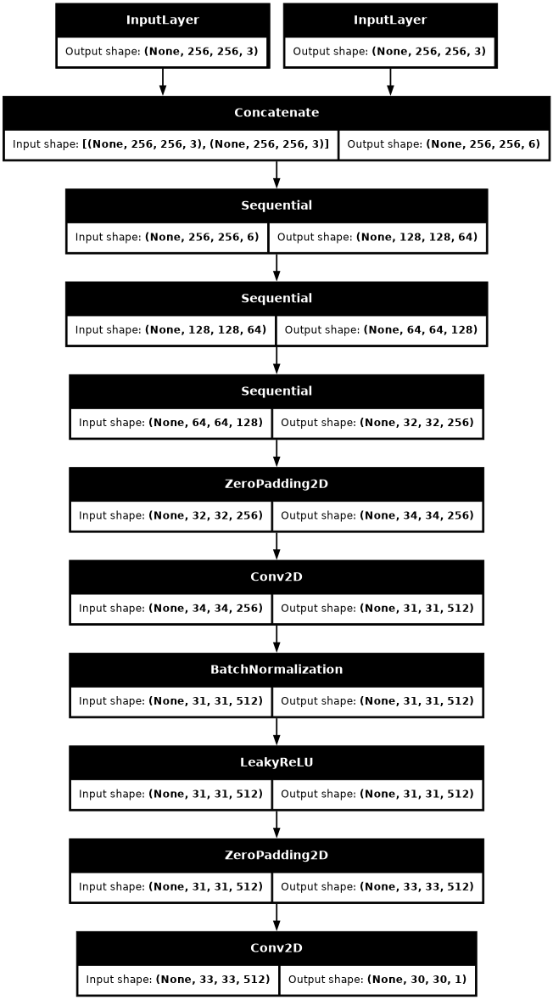

In [32]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

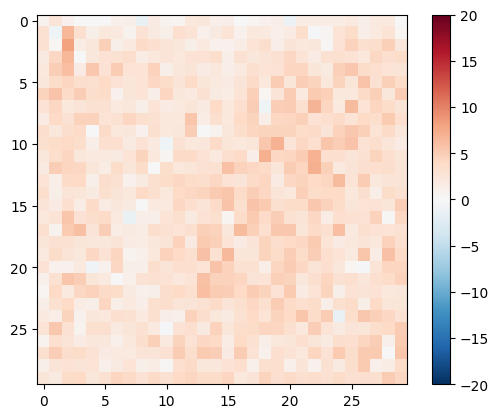

In [33]:
disc_out = discriminator([inp[tf.newaxis, ...], gen_output], training=False)
plt.imshow(disc_out[0, ..., -1], vmin=-20, vmax=20, cmap='RdBu_r')
plt.colorbar()

In [34]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

In [35]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [36]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

In [37]:
def generate_images(model, test_input, tar):
    prediction = model(test_input, training=True)
    plt.figure(figsize=(15, 15))

    display_list = [test_input[0], tar[0], prediction[0]]
    title = ['Input Image', 'Ground Truth', 'Predicted Image']

    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        # Getting the pixel values in the [0, 1] range to plot.
        plt.imshow(display_list[i] * 0.5 + 0.5)
        plt.axis('off')
    plt.show()

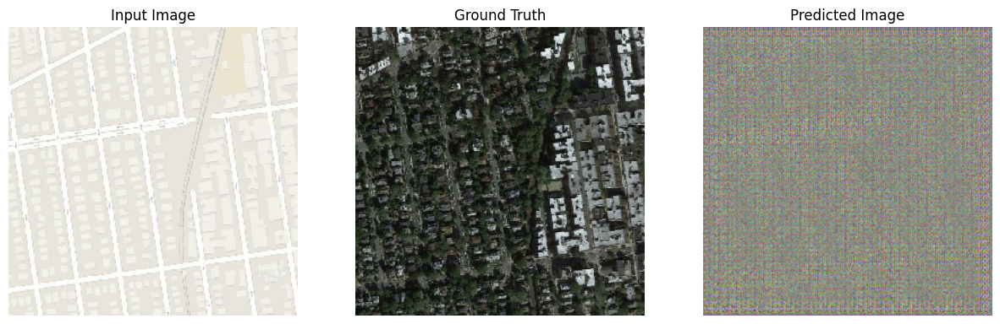

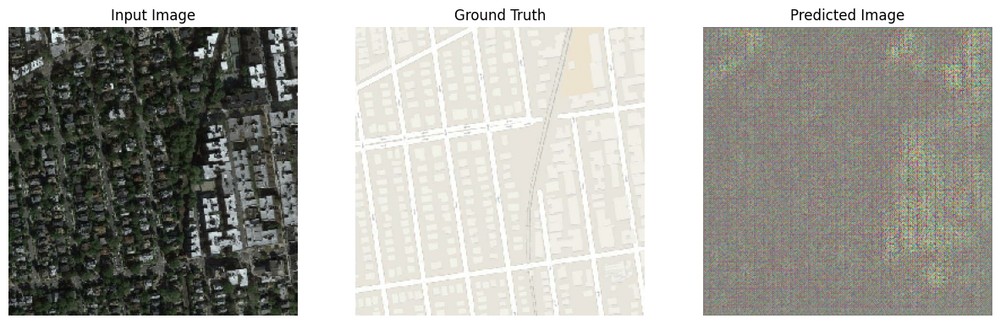

In [38]:
for example_target, example_input in test_dataset.take(1):
  generate_images(generator, example_input, example_target)
  generate_images(generator, example_target, example_input)

In [39]:
log_dir="logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [40]:
@tf.function
def train_step(input_image, target, step):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)

    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

  with summary_writer.as_default():
    tf.summary.scalar('gen_total_loss', gen_total_loss, step=step//1000)
    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=step//1000)
    tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=step//1000)
    tf.summary.scalar('disc_loss', disc_loss, step=step//1000)
  return gen_total_loss,disc_loss

In [41]:
def fit(train_ds, test_ds, steps):
  example_target, example_input = next(iter(test_ds.take(1)))
  start = time.time()
    
  for step,(input_image, target) in train_ds.repeat().take(steps).enumerate():
      gen_loss, disc_loss = train_step(input_image, target,step)

      # Training step
      if (step+1) % 10 == 0:
          print('.', end='', flush=True)

      # Clear the display and run generate_images to show progress
      if (step + 1) % 1000 == 0:
          print(f'\nStep {step+1}, Time: {time.time()-start:.2f} seconds, '
                f'Gen Loss: {gen_loss.numpy():.4f}, Disc Loss: {disc_loss.numpy():.4f}')
          # Generate and display images
          generate_images(generator, example_input, example_target)

      # Save (checkpoint) the model every 5k steps
      if (step + 1) % 5000 == 0:
          checkpoint.save(file_prefix=checkpoint_prefix)
          print(f'Checkpoint saved at step {step+1}')

In [42]:
%load_ext tensorboard
%tensorboard --logdir {log_dir}

....................................................................................................
Step 1000, Time: 84.31 seconds, Gen Loss: 19.1675, Disc Loss: 0.6126


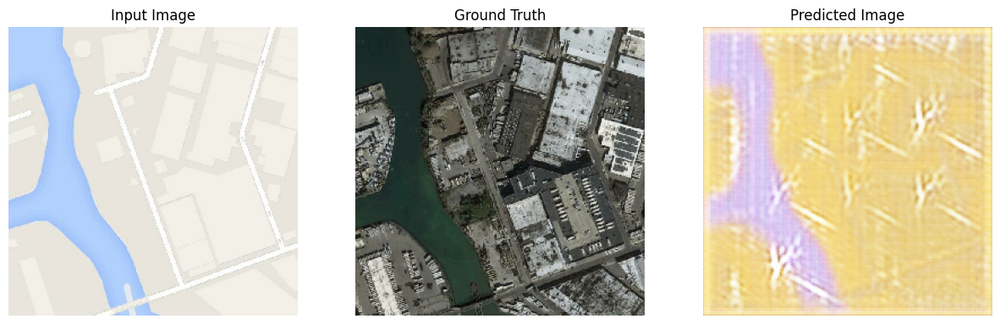

....................................................................................................
Step 2000, Time: 153.99 seconds, Gen Loss: 8.6118, Disc Loss: 0.7459


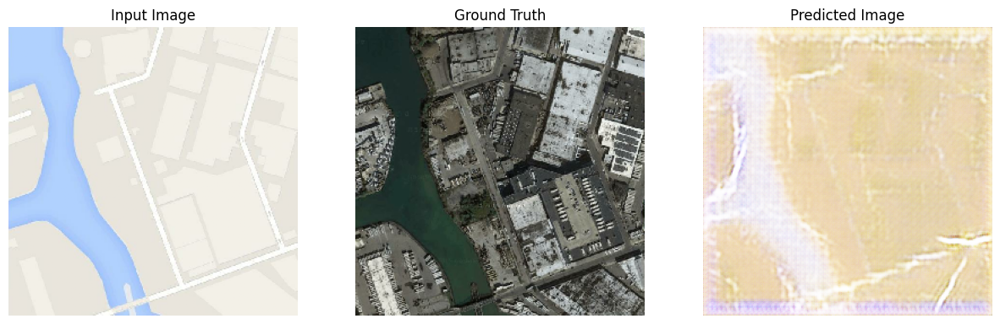

....................................................................................................
Step 3000, Time: 223.66 seconds, Gen Loss: 7.2360, Disc Loss: 0.5171


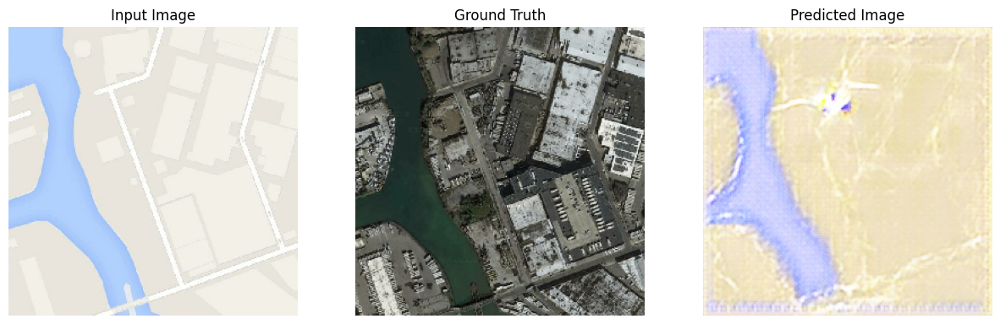

....................................................................................................
Step 4000, Time: 293.03 seconds, Gen Loss: 6.9703, Disc Loss: 0.8514


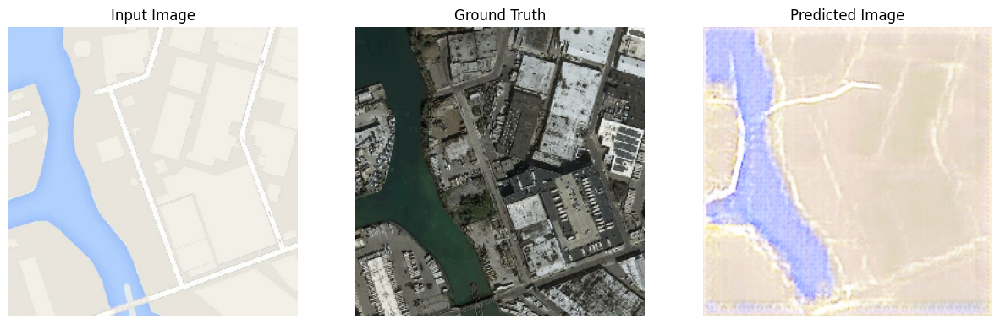

....................................................................................................
Step 5000, Time: 362.50 seconds, Gen Loss: 12.3478, Disc Loss: 0.4542


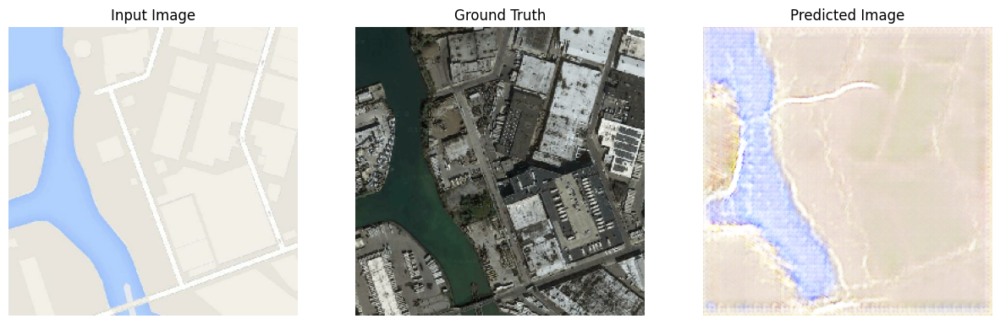

Checkpoint saved at step 5000
....................................................................................................
Step 6000, Time: 432.75 seconds, Gen Loss: 9.0886, Disc Loss: 0.5454


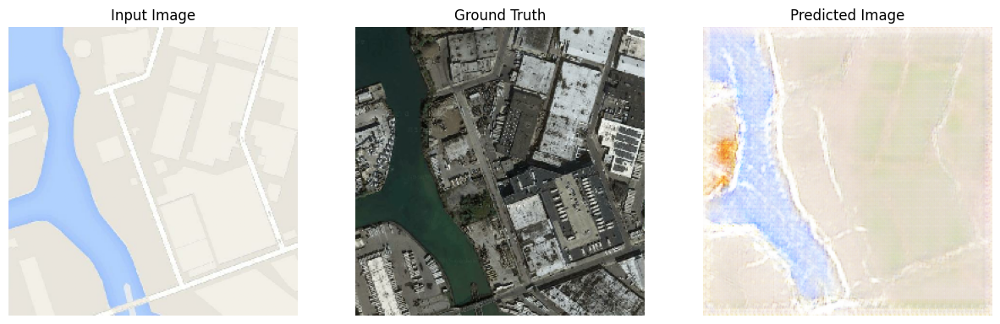

....................................................................................................
Step 7000, Time: 500.56 seconds, Gen Loss: 9.6117, Disc Loss: 0.6227


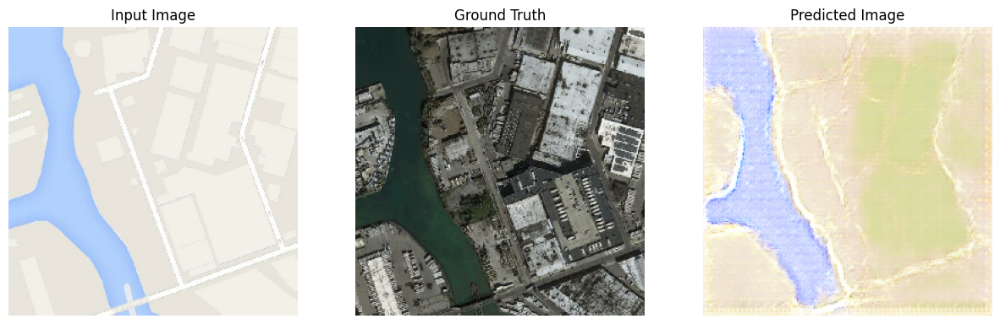

....................................................................................................
Step 8000, Time: 568.32 seconds, Gen Loss: 14.2142, Disc Loss: 0.2928


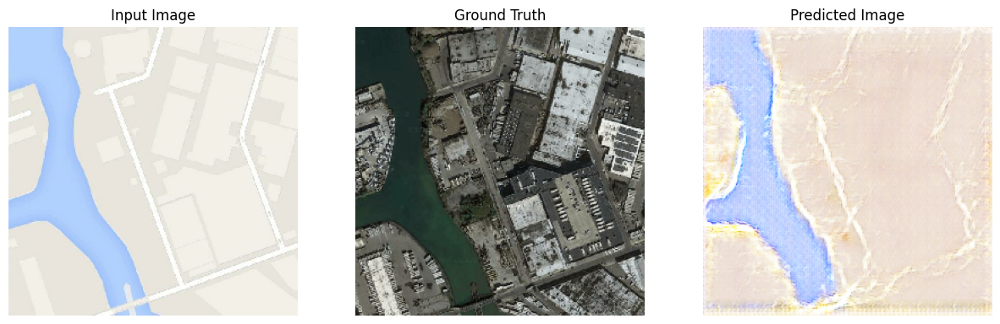

....................................................................................................
Step 9000, Time: 636.02 seconds, Gen Loss: 12.7537, Disc Loss: 0.1650


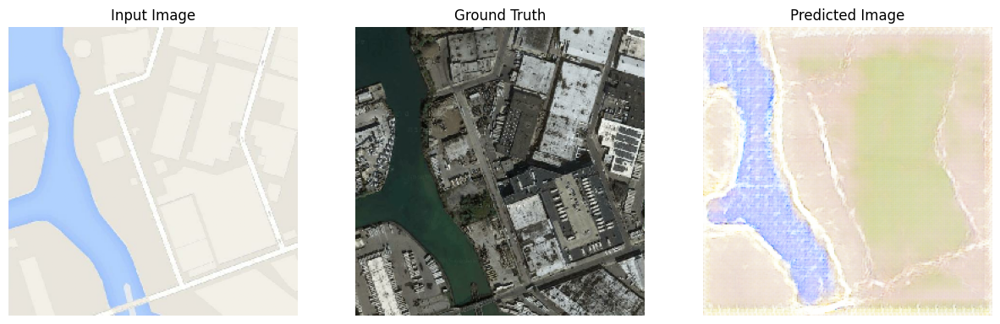

....................................................................................................
Step 10000, Time: 703.77 seconds, Gen Loss: 8.4113, Disc Loss: 0.4667


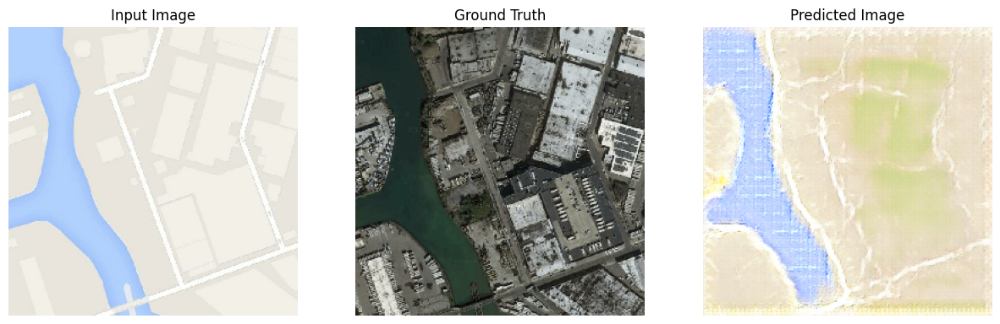

Checkpoint saved at step 10000
....................................................................................................
Step 11000, Time: 773.05 seconds, Gen Loss: 8.8193, Disc Loss: 0.9117


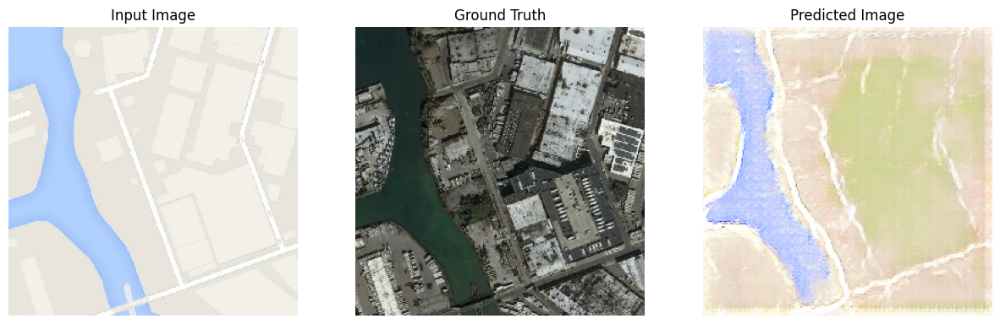

....................................................................................................
Step 12000, Time: 841.11 seconds, Gen Loss: 8.3713, Disc Loss: 0.6666


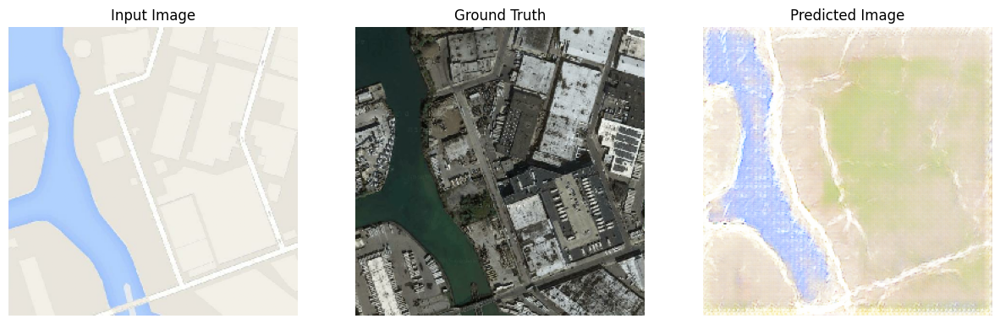

....................................................................................................
Step 13000, Time: 909.43 seconds, Gen Loss: 18.6359, Disc Loss: 0.3599


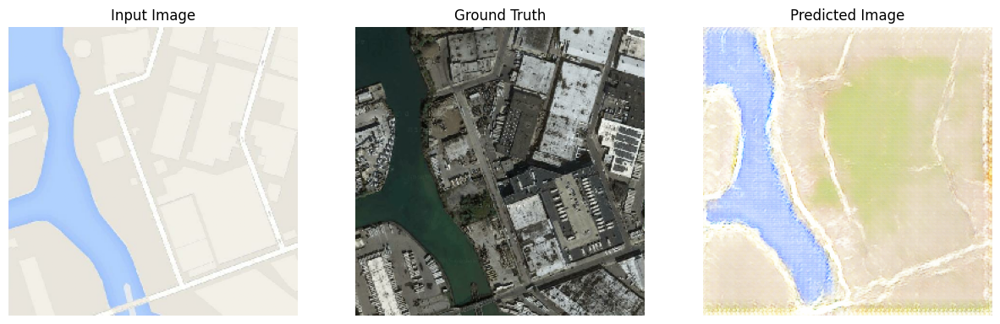

....................................................................................................
Step 14000, Time: 977.33 seconds, Gen Loss: 4.9658, Disc Loss: 0.0458


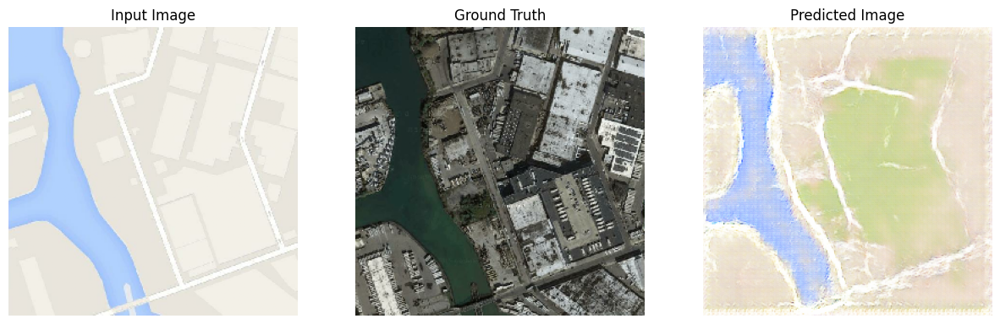

....................................................................................................
Step 15000, Time: 1045.23 seconds, Gen Loss: 6.4753, Disc Loss: 0.7507


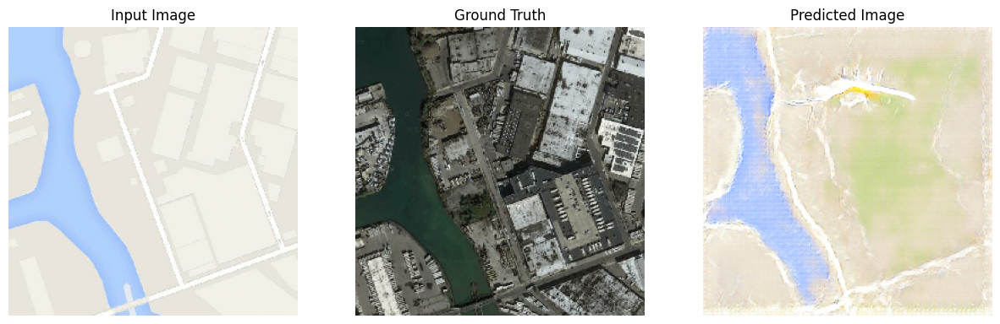

Checkpoint saved at step 15000


In [43]:
fit(train_dataset, test_dataset, steps=15000)